In [76]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
# Example 3 - Single Cell Mapping
#
# This notebook contains one example of how
# the results from integrating single cell
# and spatial transcriptomics data may
# look.
#
# Single cell type proportions are
# estimated within each spot using stereoscope
#
# github link : https://github.com/almaan/stereoscope
# biorxiv link : https://www.biorxiv.org/content/10.1101/2019.12.13.874495v1
# 
# other methods can of course be used as well

In [77]:
# Import libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

import PIL.Image as Image

import helpers
import stx as stx
import utils as ut

In [78]:
# Load data
pths = dict(sample_2 = dict(cnt = "../_data/Allen-2/Allen-2-count-matrix.tsv.gz",
                            img = "../_data/Allen-2/tissue_hires_image.png",
                            scf = "../_data/Allen-2/scalefactors_json.json",
                            mta = "../_data/Allen-2/allen-2-stereoscope.tsv",
                            ),
            sample_1 = dict(cnt = "../_data/Allen-1/Allen-1-count-matrix.tsv.gz",
                            img = "../_data/Allen-1/tissue_hires_image.png",
                            scf = "../_data/Allen-1/scalefactors_json.json",
                            mta = "../_data/Allen-1/allen-1-stereoscope.tsv",
                            ),
           )

data_1 = stx.STdata(**pths["sample_1"])
data_2 = stx.STdata(**pths["sample_2"])
bundle = stx.DataBundle([data_1,data_2])

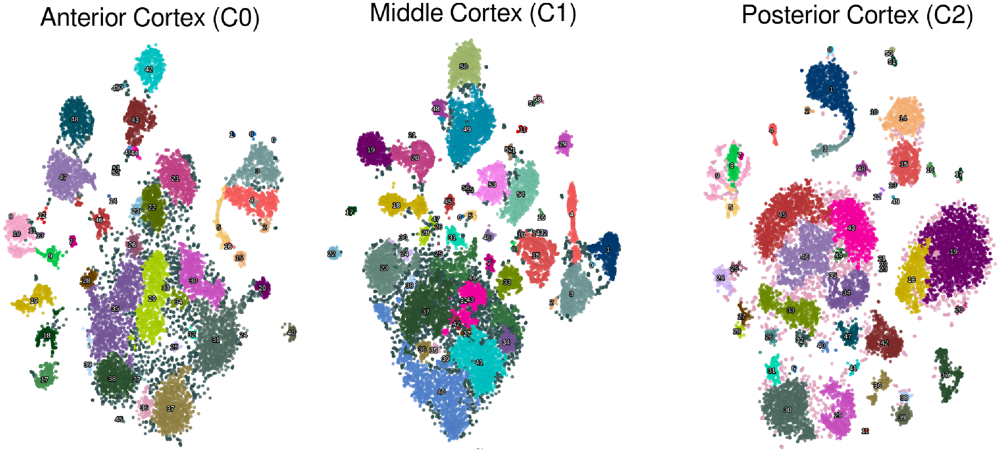

In [127]:
# The single cell data used originates from
# the site mousebrain.org.
#
# Three data sets from the cortex have been merged
#    - Anterior Cortex
#    - Middle Cortex
#    - Posterior Cortex
#
# Each of the clusters have been mapped
# onto the visium slides. These clusters
# (within the single cell data) are visualized
# below.

cluster_img = np.asarray(Image.open("../data/img/mousebrain-clusters.png"))

fig, ax = plt.subplots(figsize = (cluster_img.shape[0] / 20,
                                  cluster_img.shape[1] / 20))
ax.imshow(cluster_img)
ut.clean_spines(ax)
ut.clean_ticks(ax)

plt.show()

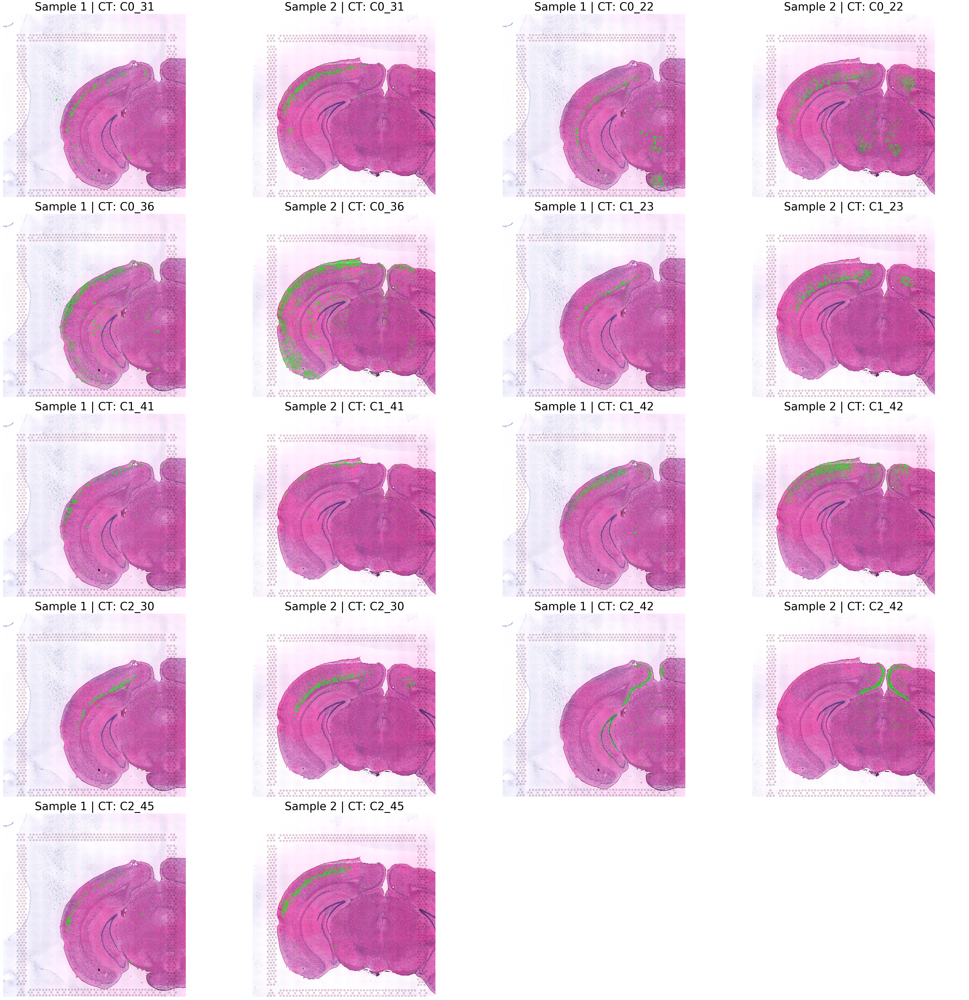

In [129]:
# Having used stereoscope with the top 5000 genes
# we have proportion estimates of all clusters
# within every spot.
#
# Below we'll see these proportion values overlaid
# on the tissue.

%matplotlib inline
look_at = ['C0_31','C0_22','C0_36','C1_23','C1_41','C1_42','C2_30','C2_42','C2_45']
n_vis = len(look_at)
n_rows = 5
n_cols = np.ceil(bundle.n_sets * n_vis / n_rows).astype(int)

fig, ax = plt.subplots(n_rows,n_cols,figsize = (50,50))
ax = ax.flatten()

for k,ct in enumerate(look_at):
    for s in range(bundle.n_sets): 
        rgba = np.zeros((bundle.sets[s].S,4))
        rgba[:,1] = 1
        rgba[:,3] =  bundle.sets[s].mta[ct].values
        rgba[:,3] /= rgba[:,3].max()
        
        ax[2*k + s].imshow(bundle.sets[s].img)
        ax[2*k + s].scatter(bundle.sets[s].crd[:,1] * bundle.sets[s].sf,
                      bundle.sets[s].crd[:,0] * bundle.sets[s].sf,
                      c = rgba,
                      s = 40,
                     )
        
        ax[2*k + s].set_title('Sample ' + str(s+1) + " | CT: " + str(ct),
                             fontsize = 40)
        
for aa in ax:
    ut.clean_spines(aa)
    ut.clean_ticks(aa)
      
fig.tight_layout()